# 3. Fitting diads once you have groups
- Once you have divided your diads into groups based on strengths, you need to tweak the fit parameters for each group
- Then you can loop through all files in a given group and automatically fit the spectra

In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import DiadFit as pf
pf.__version__

'0.0.88'

## Specifying filetype, and folder as before

In [48]:
# This specifies what file type your Raman exported in. 
meta_path, spectra_path, spectra_filetype, prefix, str_prefix, spectra_file_ext, meta_file_ext, TruPower=pf.get_settings()

## Load in data and fit parameters
- This loads in the dataframes of the fit parameters you saved in the other file, by group
- At this point you select what group you want to fit (batch = 'Weak', 'Medium' or 'Strong'). After running through the entire notebook for one group, come back up here to fit a second group.

In [49]:
## load dataframes and numpy arrays 
np_x = joblib.load('np_x.sav')

# Select the group you want to fit ('Weak', 'Medium', 'Strong'). After selecting one, go through and select another one and run again from here. 
batch='Weak' # Options are Weak, Medium, Strong

if batch=='Weak':
    GroupN_df=joblib.load('Weak_df.sav')
if batch=='Medium':
    GroupN_df=joblib.load('Medium_df.sav')
if batch=='Strong':
    GroupN_df=joblib.load('Strong_df.sav')

### Now load one file from this group to tweak parameters for

In [50]:
Diad_Files =GroupN_df['filename']
i=0


### Lets plot the diad to have a look at it

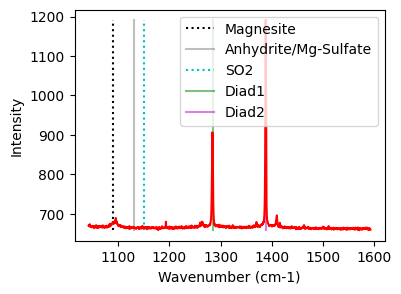

In [51]:
plot1=pf.plot_diad(path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype)

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

## Choose a model for fitting all peaks
- Option of Voigt or PseudoVoigt. We recomend PsuedoVoigt

In [52]:
model_name='PseudoVoigtModel'

## Fit Diad 1
- Tweak the parameters in the config files for each group. E.g. how many peaks (fit_peaks), the background positions, the sigma of the diad, and whether or not you want a gaussian background

In [53]:
diad_id_config=pf.diad_id_config(height=50, exclude_range1=[1308, 1309])
diad_id_config

if batch=='Weak':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1250),
    upper_bck_diad1=(1300, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Medium':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1240),
    upper_bck_diad1=(1315, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Strong':
    diad1_fit_config_init=pf.diad1_fit_config(
    fit_gauss=True, gauss_amp= 2*GroupN_df['HB1_abs_prom'].iloc[i],
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1250), upper_bck_diad1=(1300, 1350), fit_gauss=False, gauss_amp=1000, diad_sigma=0.6, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=249.24856336538312, HB_prom=nan, x_range_baseline=30, y_range_baseline=100, dpi=200, x_range_residual=10, return_other_params=False)

### See what these fit parameters look like for diad1

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_cent_err,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,Diad1_Combofit_Height,Diad1_Residual,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit,Diad1_Asym50,Diad1_Asym70,Diad1_Yuan2017_sym_factor,Diad1_Remigi2021_BSF,Diad1_PDF_Model
0,1284.142577,1284.142577,0.01016,723.943543,1.059939,0,247.945502,3.382698,0.704695,2.119878,Flagged Warnings:,1.189236,1.255696,0.401158,0.00855,PseudoVoigtModel


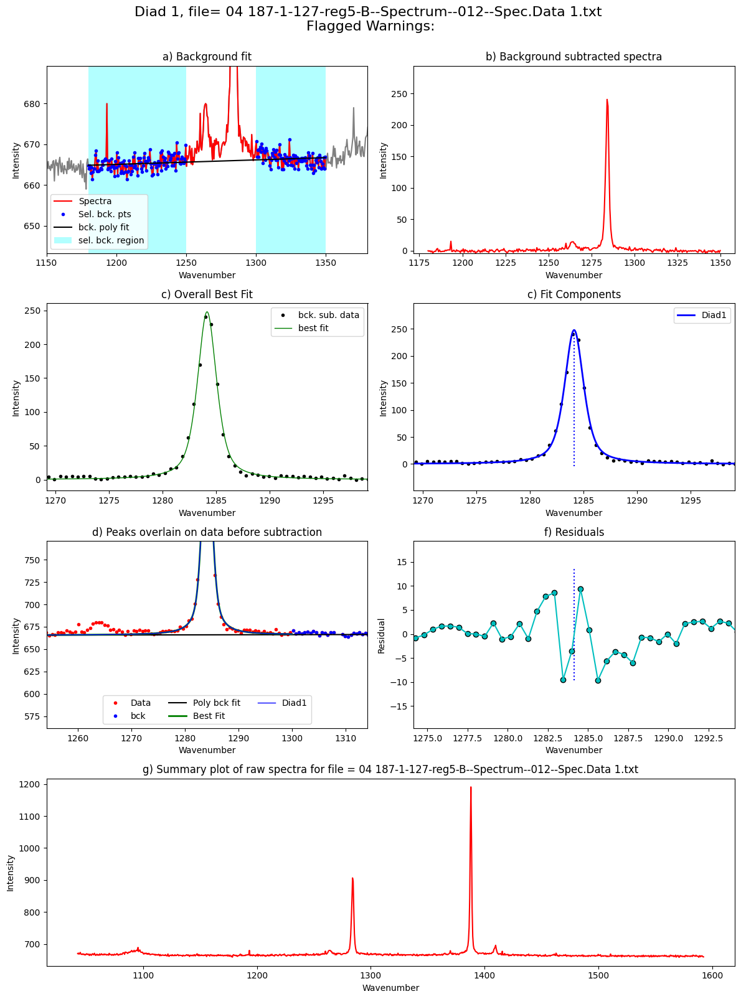

In [54]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config,
path=spectra_path, filename=Diad_Files.iloc[0],
filetype=spectra_filetype, plot_figure=True, close_figure=False,
Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
HB_pos=GroupN_df['HB1_pos'].iloc[i])
Diad1_fit

### Update the sigma
- The sigma parameter varies quite a lot based on the splitting. Best to update your first guess with what you found for the example file above

In [55]:
diad1_fit_config2=diad1_fit_config_init

## Fit diad2

In [56]:
if batch=='Weak':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=2, upper_bck_diad2=(1430, 1480),
    lower_bck_diad2=(1310, 1360), diad_sigma=0.4,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Medium':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1350), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Strong':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init
diad2_fit_config_init

diad2_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad2=2, lower_bck_diad2=(1310, 1360), upper_bck_diad2=(1430, 1480), fit_gauss=False, gauss_amp=1000, diad_sigma=0.4, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=526.0977129714163, HB_prom=nan, C13_prom=10, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=30, return_other_params=False)

### See what these fit parameters look like for diad2

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_cent_err,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,Diad2_Combofit_Height,Diad2_Residual,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit,Diad2_Asym50,Diad2_Asym70,Diad2_Yuan2017_sym_factor,Diad2_Remigi2021_BSF,Diad2_PDF_Model
0,1387.988726,1387.988726,0.00531,1124.301833,0.767661,0,529.351136,3.795216,0.715174,1.535321,Flagged Warnings:,1.060268,1.090164,0.092531,0.0029,PseudoVoigtModel


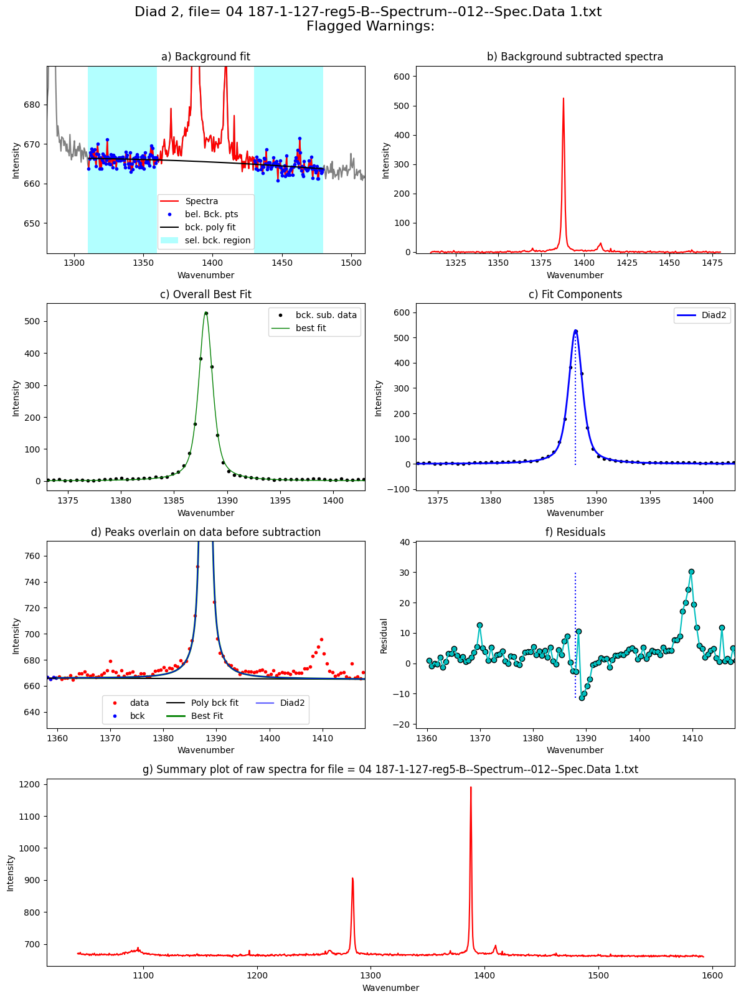

In [57]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config,
path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype,
plot_figure=True, close_figure=False, 
Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
HB_pos=GroupN_df['HB2_pos'].iloc[i], 
C13_pos=GroupN_df['C13_pos'].iloc[i])
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

## Loop over all the files in the group
- This will loop over all the 

  0%|          | 0/22 [00:00<?, ?it/s]

Processing file: 04 187-1-127-reg5-B--Spectrum--012--Spec.Data 1.txt


  5%|▍         | 1/22 [00:05<01:54,  5.45s/it]

Processing file: 05 187-1-127-reg5-C--Spectrum--015--Spec.Data 1.txt


  9%|▉         | 2/22 [00:10<01:49,  5.48s/it]

Processing file: 06 187-1-127-reg5-D--Spectrum--018--Spec.Data 1.txt


 14%|█▎        | 3/22 [00:15<01:36,  5.10s/it]

Processing file: 08 187-1-127-reg6-A--Spectrum--024--Spec.Data 1_CRR_DiadFit.txt


 18%|█▊        | 4/22 [00:20<01:29,  4.95s/it]

Processing file: 09 187-1-127-reg6-B--Spectrum--027--Spec.Data 1.txt


 23%|██▎       | 5/22 [00:24<01:20,  4.74s/it]

Processing file: 10 187-1-127-reg6-C--Spectrum--030--Spec.Data 1.txt


 27%|██▋       | 6/22 [00:28<01:12,  4.54s/it]

Processing file: 11 187-1-127-reg6-D--Spectrum--033--Spec.Data 1.txt


 32%|███▏      | 7/22 [00:33<01:06,  4.46s/it]

Processing file: 13 187-1-127-reg7-A--Spectrum--037--Spec.Data 1.txt


 36%|███▋      | 8/22 [00:36<00:59,  4.23s/it]

Processing file: 14 187-1-127-reg7-B--Spectrum--040--Spec.Data 1.txt


 41%|████      | 9/22 [00:40<00:52,  4.03s/it]

Processing file: 15 187-1-127-reg7-C--Spectrum--043--Spec.Data 1.txt


 45%|████▌     | 10/22 [00:44<00:47,  3.92s/it]c:\users\charl\documents\python dev\diadfit\src\DiadFit\diads.py:3104: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))


Processing file: 16 187-1-127-reg8-A--Spectrum--046--Spec.Data 1.txt


 50%|█████     | 11/22 [00:48<00:44,  4.07s/it]

Processing file: 17 187-1-127-reg8-B--Spectrum--048--Spec.Data 1.txt


 55%|█████▍    | 12/22 [00:52<00:40,  4.09s/it]

Processing file: 20 187-1-128-A_withmelt--Spectrum--060--Spec.Data 1.txt


 59%|█████▉    | 13/22 [00:56<00:36,  4.11s/it]

Processing file: 21 187-1-128-B--Spectrum--063--Spec.Data 1_CRR_DiadFit.txt


 64%|██████▎   | 14/22 [01:01<00:33,  4.21s/it]

Processing file: 22 187-1-128-A--Spectrum--064--Spec.Data 1.txt


 68%|██████▊   | 15/22 [01:06<00:31,  4.47s/it]

Processing file: 23 187-1-128-C--Spectrum--067--Spec.Data 1.txt


 73%|███████▎  | 16/22 [01:10<00:26,  4.45s/it]

Processing file: 24 187-1-128-D--Spectrum--070--Spec.Data 1_CRR_DiadFit.txt


 77%|███████▋  | 17/22 [01:15<00:22,  4.42s/it]

Processing file: 26 187-1-129-A--Spectrum--076--Spec.Data 1.txt


 82%|████████▏ | 18/22 [01:20<00:18,  4.61s/it]

Processing file: 28 187-1-130-A--Spectrum--087--Spec.Data 1_CRR_DiadFit.txt


 86%|████████▋ | 19/22 [01:24<00:13,  4.56s/it]

Processing file: 30 187-1-130-B--Spectrum--094--Spec.Data 1.txt


 91%|█████████ | 20/22 [01:29<00:09,  4.64s/it]

Processing file: 31 187-1-130-C--Spectrum--100--Spec.Data 1_CRR_DiadFit.txt


 95%|█████████▌| 21/22 [01:33<00:04,  4.61s/it]

Processing file: 32 187-1-130-D_hasmelt--Spectrum--105--Spec.Data 1.txt


100%|██████████| 22/22 [01:38<00:00,  4.47s/it]


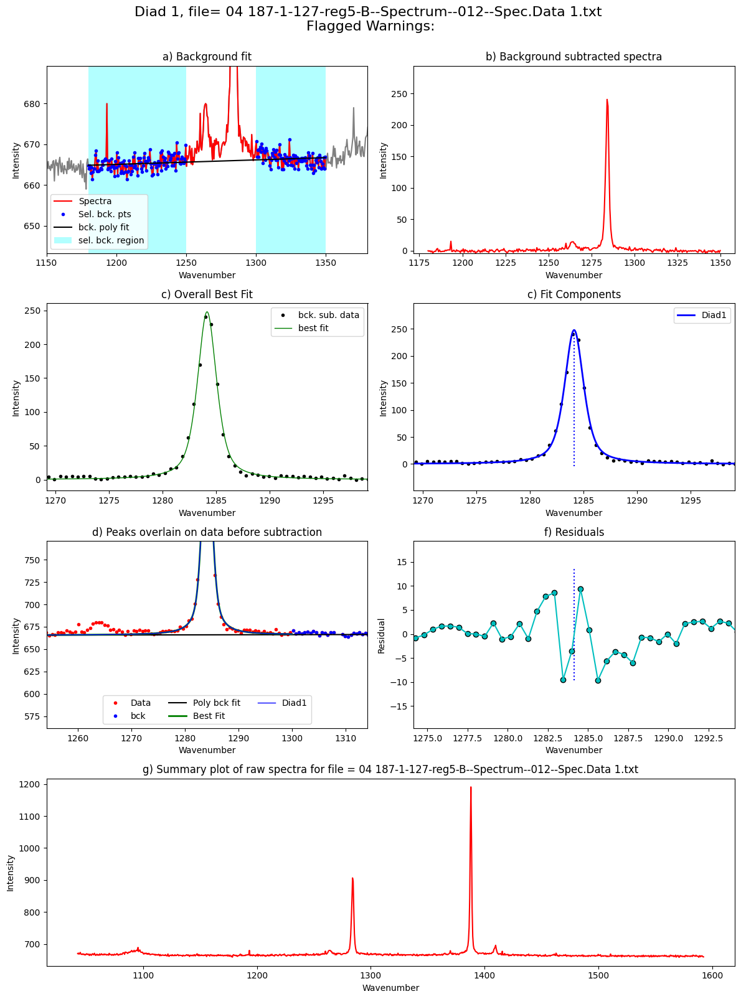

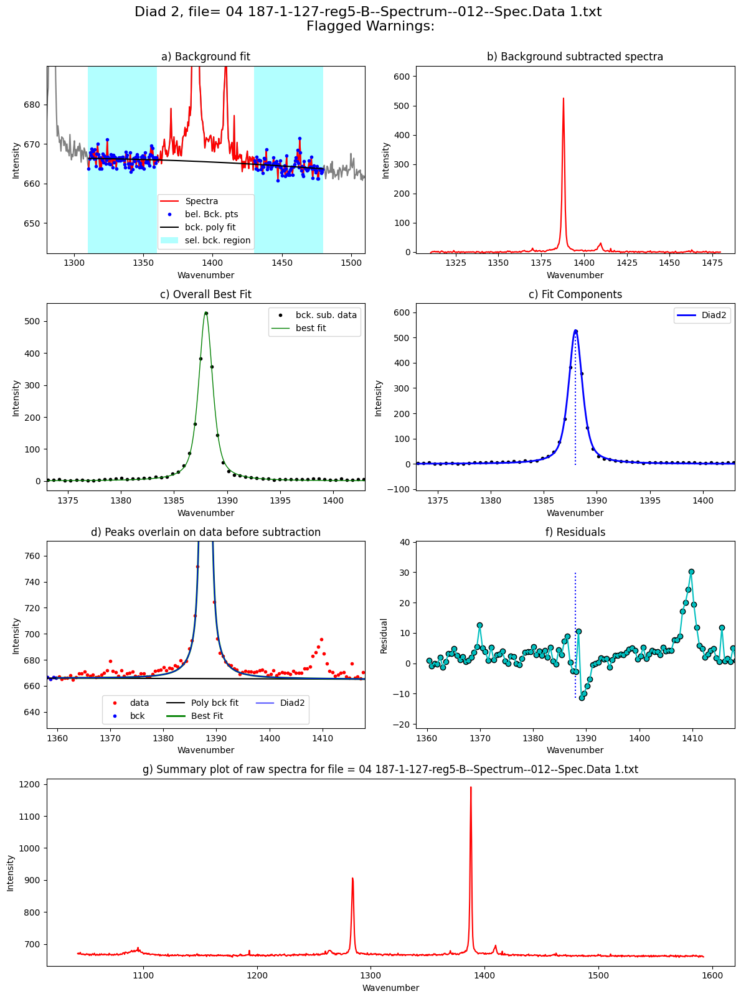

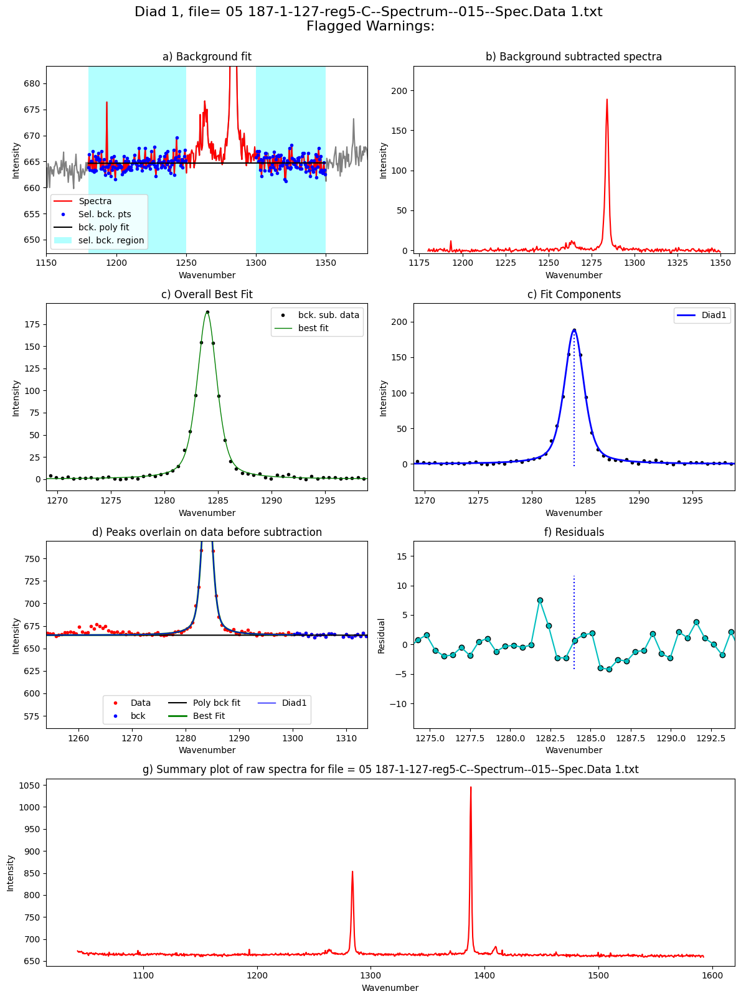

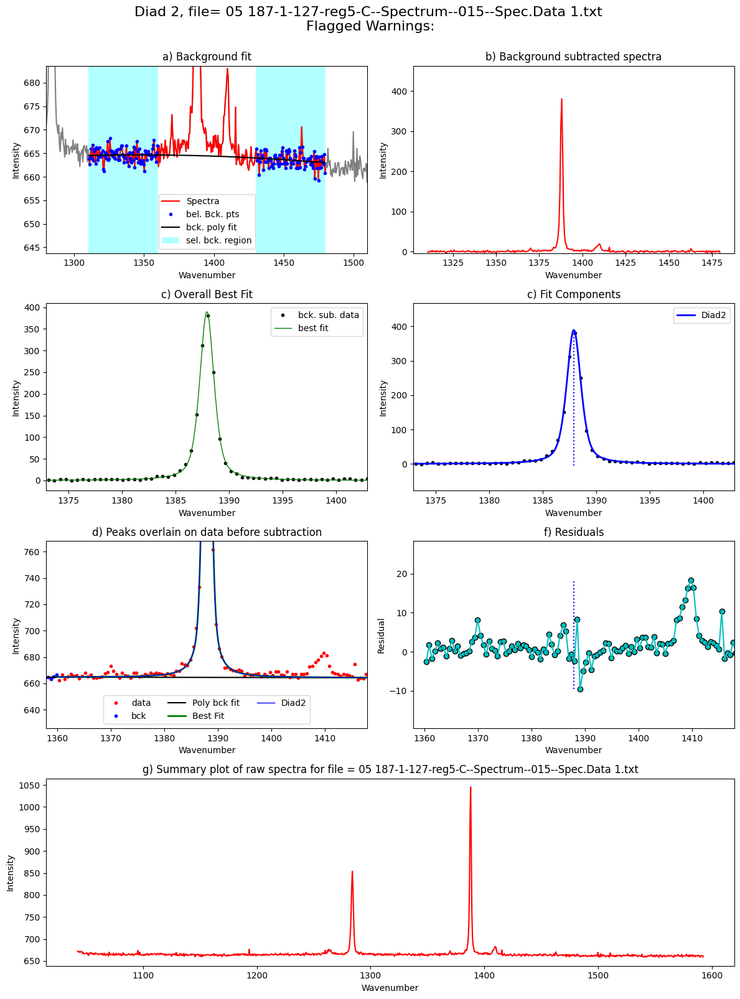

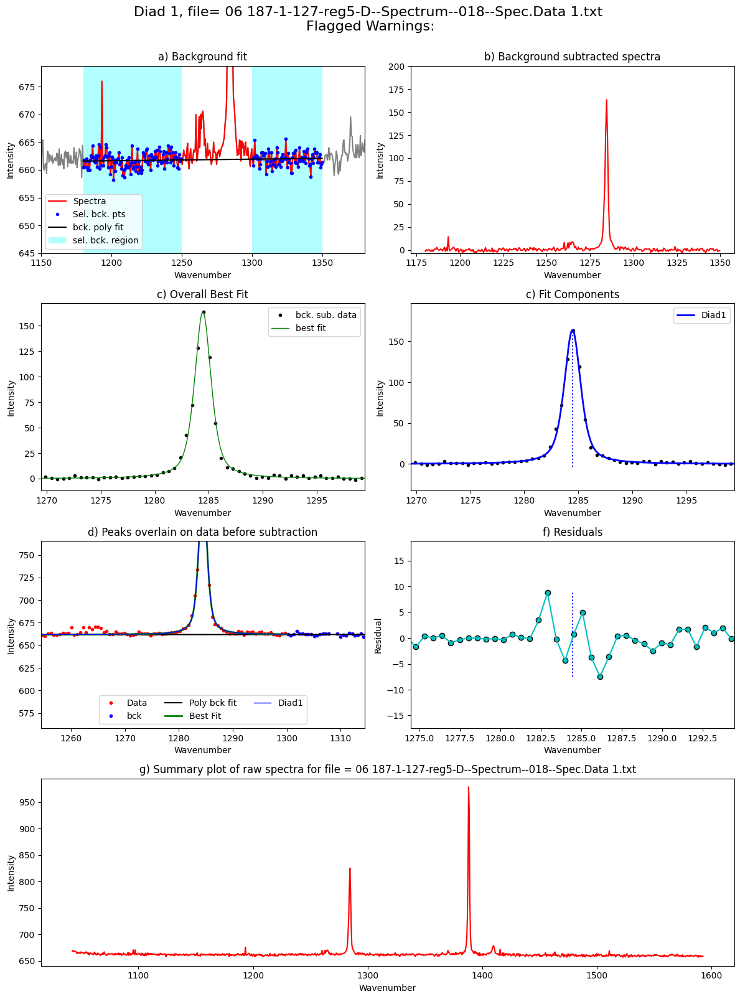

...

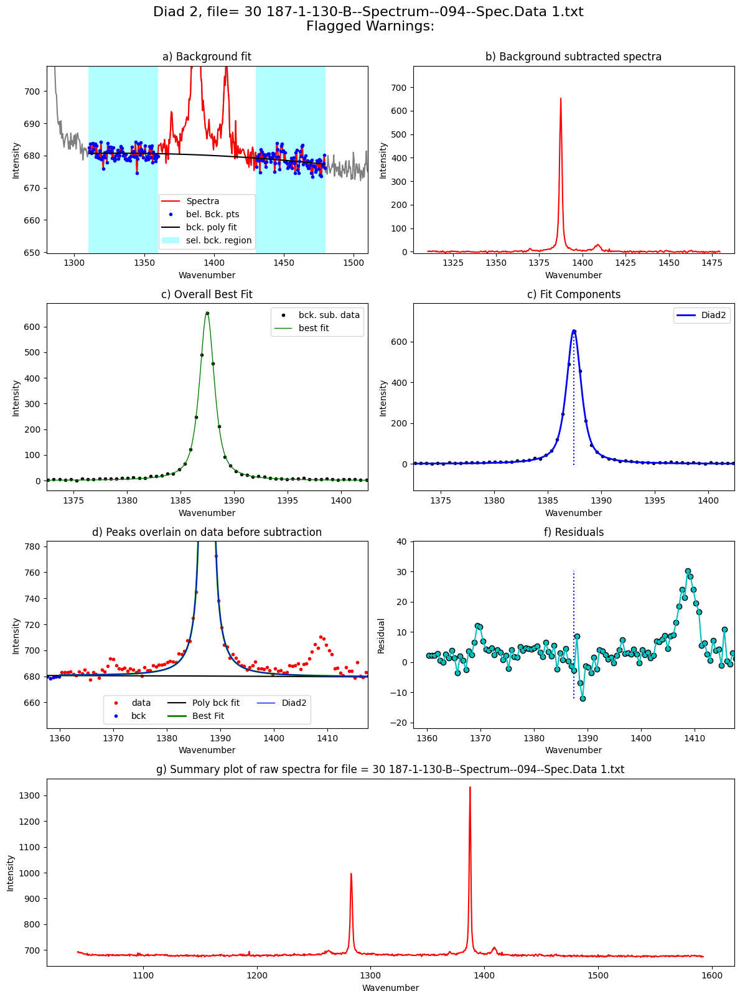

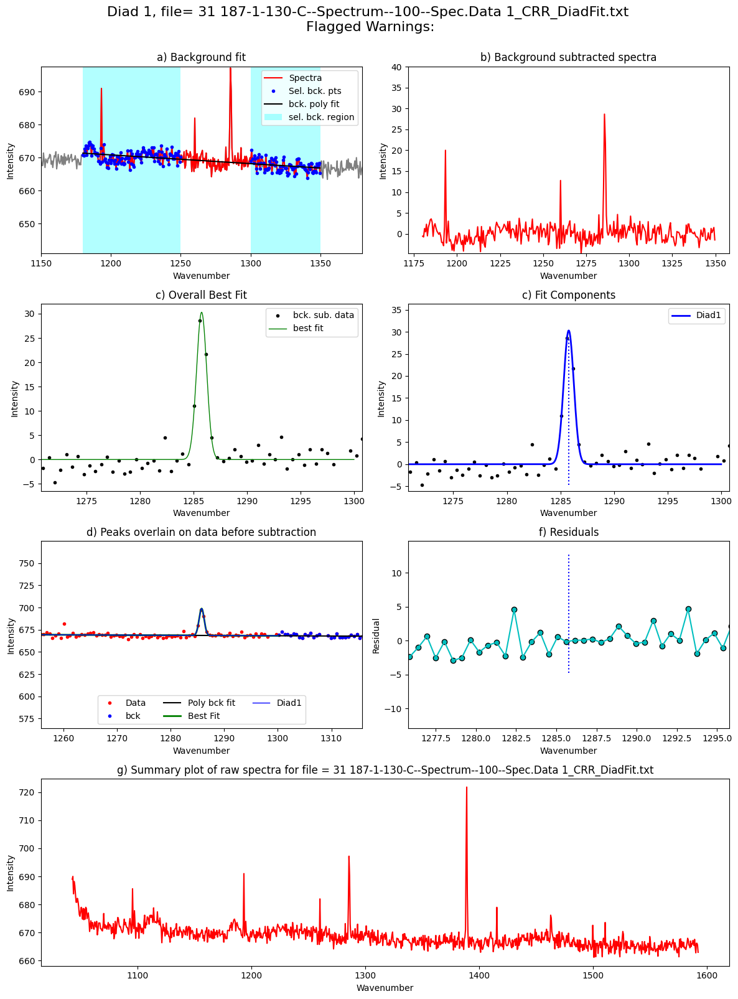

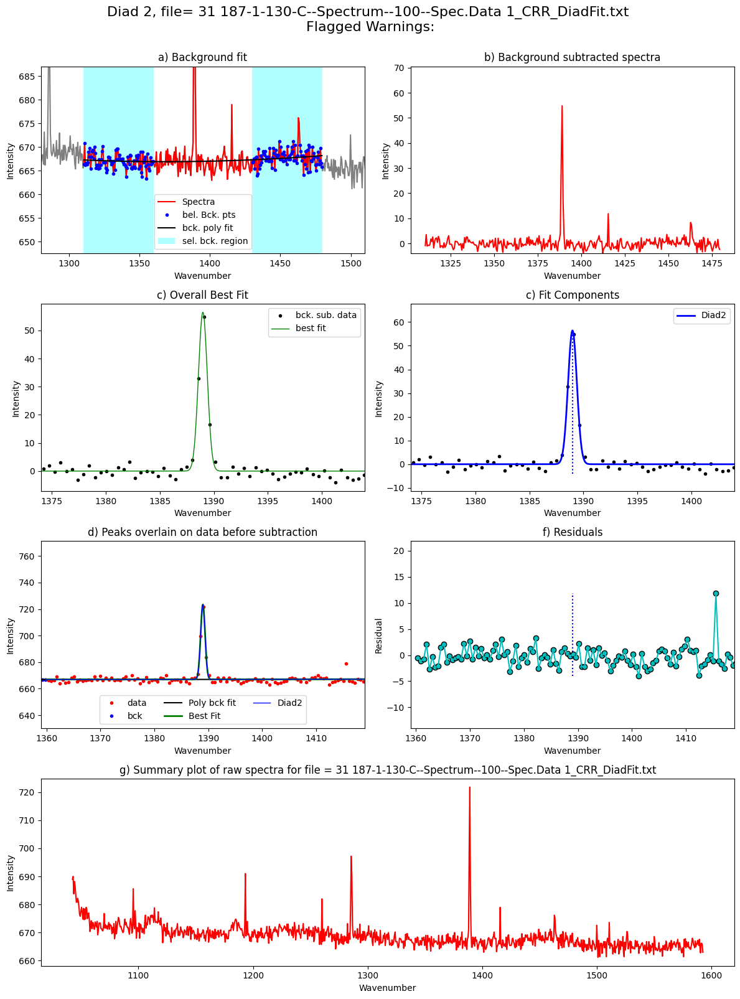

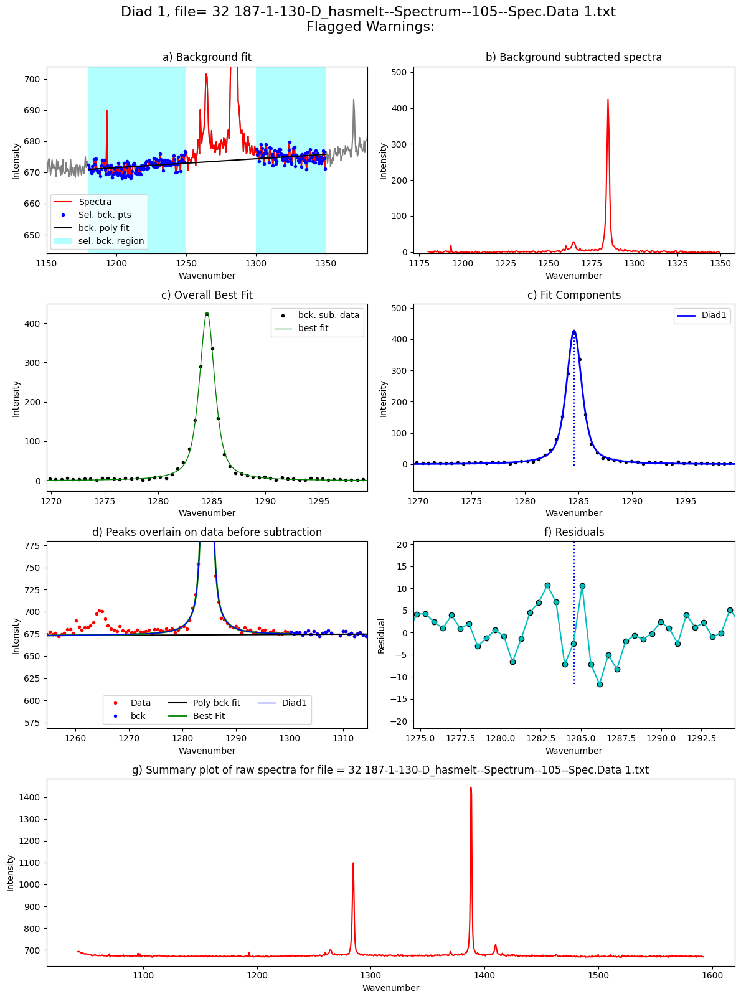

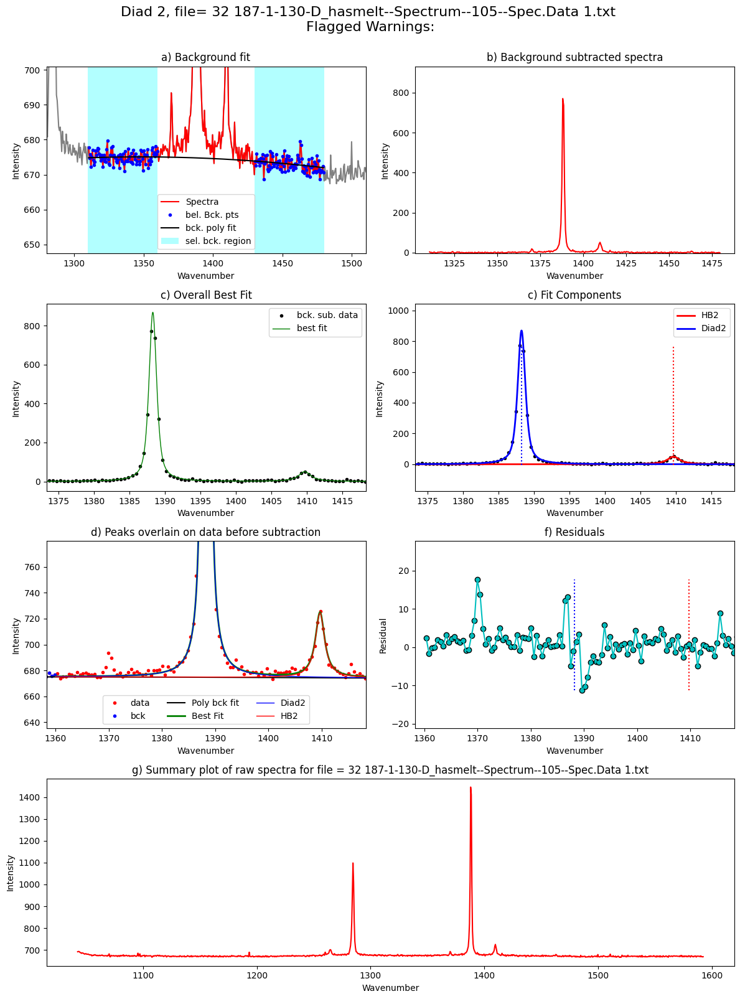

In [58]:
from tqdm import tqdm
plot_figure=True# If False, Means doesnt have to make figures, lot faster. 
close_figure=False # If True, wont show figures in notebook, but will still save them in a folder 
Diad_Files_i=Diad_Files
df_Merge = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files))): #
    tqdm.write(f"Processing file: {Diad_Files[i]}")
    
    
    # For diad1, config file like you had in the previous. 
    # Only really used to exclude a range (say your spectra has a known spec)
    diad_id_config=pf.diad_id_config(exclude_range1=[1308, 1309])
    
    # Here, the prominence are taken from the fitting in the last notebook
    diad1_fit_config2.HB_prom=GroupN_df['HB1_abs_prom'].iloc[i]
    diad1_fit_config2.diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i]
    diad1_fit_config2.gauss_amp=2*GroupN_df['HB1_abs_prom'].iloc[i]

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config2,
    config2=diad_id_config, path=spectra_path, filename=GroupN_df['filename'].iloc[i],
    filetype=spectra_filetype, plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
    HB_pos=GroupN_df['HB1_pos'].iloc[i])

    ## Same for diad2, just also has a C13 peak
    diad2_fit_config_init.HB_prom=GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i]
    diad2_fit_config_init.gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.C13_prom=GroupN_df['C13_abs_prom'].iloc[i]
    
    
    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
        config2=diad_id_config,
    path=spectra_path, filename=GroupN_df['filename'].iloc[i], 
    filetype=spectra_filetype,
    plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
    HB_pos=GroupN_df['HB2_pos'].iloc[i], 
    C13_pos=GroupN_df['C13_pos'].iloc[i])
    
    # This combines the outputs into a single dataframe
    data=pf.combine_diad_outputs(filename=GroupN_df['filename'].iloc[i], prefix=prefix, 
    Diad1_fit=Diad1_fit, path=spectra_path,                  
    Diad2_fit=Diad2_fit)        
    
 

    df_Merge = pd.concat([df_Merge, data], axis=0).reset_index(drop=True)


In [59]:
# Save parameters to excel
combo=df_Merge

if batch=='Weak':
    combo.to_excel('Weak_Diads.xlsx', index=False)
if batch=='Medium':
    combo.to_excel('Medium_Diads.xlsx', index=False)
if batch=='Strong':
    combo.to_excel('Strong_Diads.xlsx', index=False)

In [60]:
combo

,filename,Splitting,Split_σ,Diad1_Combofit_Cent,Diad1_cent_err,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Residual,...,Diad1_Asym50,Diad1_Asym70,Diad1_Yuan2017_sym_factor,Diad1_Remigi2021_BSF,Diad2_Asym50,Diad2_Asym70,Diad2_Yuan2017_sym_factor,Diad2_Remigi2021_BSF,Diad1_PDF_Model,Diad2_PDF_Model
0,187-1-127-reg5-B--Spectrum--012--Spec.Data 1,103.846149,0.011464,1284.142577,0.010160,247.945502,1284.142577,723.943543,1.059939,3.382698,...,1.189236,1.255696,0.401158,0.008550,1.060268,1.090164,0.092531,0.002900,PseudoVoigtModel,PseudoVoigtModel
1,187-1-127-reg5-C--Spectrum--015--Spec.Data 1,103.943301,0.010990,1283.976499,0.009702,188.266931,1283.976499,539.169407,1.086574,2.283045,...,1.007862,1.067052,0.017085,0.011543,1.062232,1.089457,0.099121,0.004088,PseudoVoigtModel,PseudoVoigtModel
2,187-1-127-reg5-D--Spectrum--018--Spec.Data 1,103.735657,0.010820,1284.461881,0.009561,163.797793,1284.461881,406.349090,0.906981,1.791810,...,1.098039,1.247093,0.177839,0.011074,1.042500,1.056364,0.057057,0.003964,PseudoVoigtModel,PseudoVoigtModel
3,187-1-127-reg6-A--Spectrum--024--Spec.Data 1_C...,103.890837,0.047592,1284.077538,0.047523,417.100947,1284.077538,1212.508614,1.066193,4.943868,...,1.164407,1.180247,0.350579,0.005112,1.066667,1.065789,0.099932,0.001699,PseudoVoigtModel,PseudoVoigtModel
4,187-1-127-reg6-B--Spectrum--027--Spec.Data 1,103.613110,0.009453,1284.728247,0.008531,218.764594,1284.728247,510.830589,0.839777,2.340200,...,1.028056,1.089706,0.047122,0.007677,1.171196,1.164659,0.217375,0.002941,PseudoVoigtModel,PseudoVoigtModel
5,187-1-127-reg6-C--Spectrum--030--Spec.Data 1,103.649536,0.013537,1284.705880,0.012250,108.025000,1284.705880,234.116857,0.809607,1.677183,...,1.048729,1.163752,0.078902,0.014989,1.240331,1.227181,0.309301,0.006019,PseudoVoigtModel,PseudoVoigtModel
6,187-1-127-reg6-D--Spectrum--033--Spec.Data 1,103.839924,0.009835,1284.236615,0.008753,244.647587,1284.236615,678.863793,1.022491,2.842172,...,1.241187,1.303763,0.493224,0.008359,1.009153,1.054054,0.013412,0.002785,PseudoVoigtModel,PseudoVoigtModel
7,187-1-127-reg7-A--Spectrum--037--Spec.Data 1,103.793920,0.011049,1284.288838,0.009709,233.944309,1284.288838,655.653946,1.010152,2.975539,...,1.295019,1.279412,0.596028,0.008636,1.002262,1.096121,0.003347,0.003007,PseudoVoigtModel,PseudoVoigtModel
8,187-1-127-reg7-B--Spectrum--040--Spec.Data 1,103.697510,0.010282,1284.500668,0.009161,228.014033,1284.500668,575.333782,0.912699,2.953509,...,1.189796,1.283582,0.346453,0.008006,1.036496,1.040564,0.050233,0.002986,PseudoVoigtModel,PseudoVoigtModel
9,187-1-127-reg7-C--Spectrum--043--Spec.Data 1,103.786868,0.011519,1284.334509,0.010119,201.552351,1284.334509,551.211839,0.990236,2.469456,...,1.234405,1.248634,0.464232,0.009826,1.034169,1.019737,0.050579,0.003673,PseudoVoigtModel,PseudoVoigtModel


### This plays a sound when the notebook is done if you have a tendency to procrastinate

In [61]:
# !pip install winotify

from winotify import Notification, audio

toast= Notification(app_id="VSCode",title="Notebook completed",
                    msg="Step3b_Secondary_Peaks is done!",
                    duration="short")
toast.set_audio(audio.Mail,loop=False)
toast.show()